In [1]:
#Imports and initializations

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
plt.style.use('seaborn')
#%matplotlib inline

In [2]:
#Set of Task_ID's with redirect mapping

#Load and drop to relevant columns
task_id_map=pd.read_csv('task_id_info.csv');
task_id_map=task_id_map.iloc[:,[0,1,3,5]].set_index('id');

#Mapping function
def id_mapper(row):
    final_row=int(row.name);
    while pd.notna(task_id_map.loc[final_row]['redirect_id']):
            final_row=int(task_id_map.loc[final_row]['redirect_id']);
    return final_row

#Create mapped column
task_id_map['mapped_id']=task_id_map.apply(id_mapper, axis=1);
task_id_map

,redirect_id,root_id,display_name,mapped_id
id,,,,
1,120.0,1,Sound Identification,239
120,179.0,1,Sound Identification,239
179,239.0,1,Picture Sound Identification,239
239,NaN,1,Picture Sound Identification,239
2,121.0,2,Rhyming,240
...,...,...,...,...
10005,NaN,10005,Writing Self-Assessment,10005
10006,NaN,10006,Comprehension Self-Assessment,10006
10007,NaN,10007,Cognitive Function Self-Assessment,10007


In [3]:
#Task sequences from schedule and schedule task type

#Load
sched_seq=pd.read_csv('seq_from_sched.csv');

#Merge with updated task type id and drop to relevant columns
proper_seq=pd.merge(sched_seq,task_id_map, left_on='task_type_id', right_index=True).sort_index(
    )[['description','patient_id','schedule_id','mapped_id','task_level','task_order',
    'start_date','end_date','display_name']];
proper_seq.rename(columns={'description':'skill'},inplace=True);
proper_seq['lid_name']=proper_seq['display_name']+' Lvl '+proper_seq['task_level'].astype(
    'string');
proper_seq['lid']=proper_seq['mapped_id']+proper_seq['task_level']/10;
proper_seq['str_lid']=proper_seq['lid'].astype('string');

#Converting dates to timestamps
proper_seq['start_date']=pd.to_datetime(proper_seq['start_date']);
proper_seq['end_date']=pd.to_datetime(proper_seq['end_date']);

#Finding sequences for each patient for each skill and merging
pat_seq=proper_seq.groupby(['patient_id','skill'])[['str_lid','end_date']].aggregate(
        {'str_lid':'-'.join,'end_date':'max'}).rename(
        columns={'str_lid':'sequence','end_date':'seq_date'});
proper_seq=pd.merge(proper_seq,pat_seq['sequence'].reset_index());

proper_seq

,skill,patient_id,schedule_id,mapped_id,task_level,task_order,start_date,end_date,display_name,lid_name,lid,str_lid,sequence
0,Remember,380,1902470,87,2,1,2021-02-23 18:36:17,2021-02-23 18:36:17,Pattern Recreation,Pattern Recreation Lvl 2,87.2,87.2,87.2-229.2-207.4-165.1-166.1-26.3
1,Remember,380,1902470,229,2,2,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture N-Back Memory,Picture N-Back Memory Lvl 2,229.2,229.2,87.2-229.2-207.4-165.1-166.1-26.3
2,Remember,380,1902470,207,4,3,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture Matching,Picture Matching Lvl 4,207.4,207.4,87.2-229.2-207.4-165.1-166.1-26.3
3,Remember,380,1902471,165,1,4,2021-02-23 18:36:17,2021-02-23 18:36:17,Spoken Short Story,Spoken Short Story Lvl 1,165.1,165.1,87.2-229.2-207.4-165.1-166.1-26.3
4,Remember,380,1902471,166,1,5,2021-02-23 18:36:17,2021-02-23 18:36:17,Voicemail,Voicemail Lvl 1,166.1,166.1,87.2-229.2-207.4-165.1-166.1-26.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
142387,Remember,483800,2056487,229,2,2,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture N-Back Memory,Picture N-Back Memory Lvl 2,229.2,229.2,87.2-229.2-207.4-165.1-166.1-26.3
142388,Remember,483800,2056487,207,4,3,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture Matching,Picture Matching Lvl 4,207.4,207.4,87.2-229.2-207.4-165.1-166.1-26.3
142389,Remember,483800,2056488,165,1,4,2021-07-04 01:06:54,2021-07-04 01:06:54,Spoken Short Story,Spoken Short Story Lvl 1,165.1,165.1,87.2-229.2-207.4-165.1-166.1-26.3
142390,Remember,483800,2056488,166,1,5,2021-07-04 01:06:54,2021-07-04 01:06:54,Voicemail,Voicemail Lvl 1,166.1,166.1,87.2-229.2-207.4-165.1-166.1-26.3


In [4]:
#Collect stats on each sequence:  occurance, date range
#Also filtering out low occurance sequences

#Counting each occurance
sequence_data=pat_seq.groupby('skill')['sequence'].value_counts();
sequence_data.name='occurance';

#Filtering out those with less than 25 appearances
sequence_data=pd.DataFrame(sequence_data[sequence_data>24]);

#Adding in start/end dates as first and last appearance
sequence_data=sequence_data.join(proper_seq.groupby(['skill','sequence'])['start_date'].min())
sequence_data['first_active']=sequence_data['start_date'].dt.floor('d');
sequence_data.drop(columns='start_date',inplace=True);
sequence_data=sequence_data.join(proper_seq.groupby(['skill','sequence'])['start_date'].max())
sequence_data['last_active']=sequence_data['start_date'].dt.floor('d');
sequence_data.drop(columns='start_date',inplace=True);

sequence_data

occurance  \
skill                   sequence                                               
Focus your attention    259.3-215.4-148.1                               3930   
                        259.8-215.6-148.1                                 54   
Listen and understand   238.3-165.2-165.4                               7264   
                        212.2-165.4                                      549   
Plan and organize       206.4-237.1-132.1                               2105   
Read                    256.1-208.1-108.2-248.4-226.3                   4787   
                        256.1-208.1-108.2                                806   
                        140.3-108.3                                      283   
                        248.4-226.3-140.3-108.3                           60   
Remember                87.2-229.2-207.4-165.1-166.1-26.3               4432   
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3       3366   
                        251.2-219.3-223.3-240.3-244.3                   1838   
                        226.3-223.3-244.3                                 97   
Understand what you see 259.3-130.2-136.4                               1919   
                        216.1-136.4-132.1                                196   
Use math and numbers    43.1-133.1-15.1                                 1859   
                        15.2-133.1                                        84   
Write                   231.2-242.4                                     1065   
                        242.5                                             45   

                                                                  first_active  \
skill                   sequence                                                 
Focus your attention    259.3-215.4-148.1                           2020-06-08   
                        259.8-215.6-148.1                           2020-06-08   
Listen and understand   238.3-165.2-165.4                           2020-06-08   
                        212.2-165.4                                 2020-06-09   
Plan and organize       206.4-237.1-132.1                           2020-06-08   
Read                    256.1-208.1-108.2-248.4-226.3               2020-06-08   
                        256.1-208.1-108.2                           2020-06-08   
                        140.3-108.3                                 2020-06-08   
                        248.4-226.3-140.3-108.3                     2020-06-09   
Remember                87.2-229.2-207.4-165.1-166.1-26.3           2020-06-08   
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3   2020-06-08   
                        251.2-219.3-223.3-240.3-244.3               2020-06-08   
                        226.3-223.3-244.3                           2020-06-08   
Understand what you see 259.3-130.2-136.4                           2020-06-08   
                        216.1-136.4-132.1                           2020-06-10   
Use math and numbers    43.1-133.1-15.1                             2020-06-08   
                        15.2-133.1                                  2020-06-16   
Write                   231.2-242.4                                 2020-06-08   
                        242.5                                       2020-06-16   

                                                                  last_active  
skill                   sequence                                               
Focus your attention    259.3-215.4-148.1                          2021-07-04  
                        259.8-215.6-148.1                          2021-06-26  
Listen and understand   238.3-165.2-165.4                          2021-07-03  
                        212.2-165.4                                2021-07-03  
Plan and organize       206.4-237.1-132.1                          2021-07-03  
Read                    256.1-208.1-108.2-248.4-226.3              2021-07-03  
                       

In [5]:
#Filtering and joining in session data

#Filtering out anomolous sequences from main data
seq_acc_data=proper_seq[proper_seq['sequence'].isin(
    sequence_data.reset_index('sequence')['sequence'])];

#Loading session data containing accuracies
sess_data=pd.read_csv('sess_acc_v2.csv');
sess_data=sess_data.drop_duplicates(sess_data.columns[2:]);
sess_data['lid']=pd.merge(sess_data,task_id_map, left_on='task_type_id', right_index=True
                         ).sort_index()['mapped_id']+sess_data['task_level']/10;

#Joining the session accuracies in and trimming columns
seq_acc_data=pd.merge(seq_acc_data,sess_data,on=['patient_id','schedule_id','lid'],how='left');
seq_acc_data.drop(columns=['schedule_id','mapped_id','task_level_x','str_lid',
                           'timestamp','display_name','parent_id','task_type_id',
                           'task_level_y','skill_name','task_name'],inplace=True);

#Filtering out objective assessments which were never started
seq_acc_data=seq_acc_data.groupby(['patient_id','skill']).filter(
    lambda x: x['accuracy'].notna().sum()>0);

seq_acc_data

,skill,patient_id,task_order,start_date,end_date,lid_name,lid,sequence,event_id,accuracy,latency,end_reason,total_task_count,completed_task_count
0,Remember,380,1,2021-02-23 18:36:17,2021-02-23 18:36:17,Pattern Recreation Lvl 2,87.2,87.2-229.2-207.4-165.1-166.1-26.3,163333065.0,0.834,20.98,tasks completed,2.0,2.0
1,Remember,380,2,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture N-Back Memory Lvl 2,229.2,87.2-229.2-207.4-165.1-166.1-26.3,163333385.0,0.678,34.29,tasks completed,2.0,2.0
2,Remember,380,3,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture Matching Lvl 4,207.4,87.2-229.2-207.4-165.1-166.1-26.3,163333629.0,0.774,137.23,tasks completed,2.0,2.0
3,Remember,380,4,2021-02-23 18:36:17,2021-02-23 18:36:17,Spoken Short Story Lvl 1,165.1,87.2-229.2-207.4-165.1-166.1-26.3,163334460.0,0.667,12.23,tasks completed,3.0,3.0
4,Remember,380,5,2021-02-23 18:36:17,2021-02-23 18:36:17,Voicemail Lvl 1,166.1,87.2-229.2-207.4-165.1-166.1-26.3,163334787.0,0.667,8.56,tasks completed,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142211,Remember,483800,2,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture N-Back Memory Lvl 2,229.2,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN
142212,Remember,483800,3,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture Matching Lvl 4,207.4,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN
142213,Remember,483800,4,2021-07-04 01:06:54,2021-07-04 01:06:54,Spoken Short Story Lvl 1,165.1,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN
142214,Remember,483800,5,2021-07-04 01:06:54,2021-07-04 01:06:54,Voicemail Lvl 1,166.1,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#Dropoff Analysis

#Filtering out to patient's first
patient_first_filt=seq_acc_data.groupby('patient_id')[['skill','sequence']
                                                    ].first().reset_index();
first_seq_data=pd.merge(seq_acc_data,patient_first_filt);

#Loading set of last patient activity and merging with full data
patient_finals=pd.read_csv('patient_finals.csv');
first_seq_data=pd.merge(first_seq_data,patient_finals,how='left');
first_seq_data['dropped']=(
    (first_seq_data['event_id'].fillna(-1).astype('int')==
         first_seq_data['last_event_id'].fillna(-2)) 
     & ((first_seq_data.start_date.max()-pd.to_datetime(first_seq_data['last_time'])).dt.days>7)
    ).astype('int');

first_seq_data

,skill,patient_id,task_order,start_date,end_date,lid_name,lid,sequence,event_id,accuracy,latency,end_reason,total_task_count,completed_task_count,last_event_id,last_time,dropped
0,Remember,380,1,2021-02-23 18:36:17,2021-02-23 18:36:17,Pattern Recreation Lvl 2,87.2,87.2-229.2-207.4-165.1-166.1-26.3,163333065.0,0.834,20.98,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,0
1,Remember,380,2,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture N-Back Memory Lvl 2,229.2,87.2-229.2-207.4-165.1-166.1-26.3,163333385.0,0.678,34.29,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,0
2,Remember,380,3,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture Matching Lvl 4,207.4,87.2-229.2-207.4-165.1-166.1-26.3,163333629.0,0.774,137.23,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,0
3,Remember,380,4,2021-02-23 18:36:17,2021-02-23 18:36:17,Spoken Short Story Lvl 1,165.1,87.2-229.2-207.4-165.1-166.1-26.3,163334460.0,0.667,12.23,tasks completed,3.0,3.0,175663994,2021-05-26 15:25:06,0
4,Remember,380,5,2021-02-23 18:36:17,2021-02-23 18:36:17,Voicemail Lvl 1,166.1,87.2-229.2-207.4-165.1-166.1-26.3,163334787.0,0.667,8.56,tasks completed,3.0,3.0,175663994,2021-05-26 15:25:06,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35168,Remember,483800,2,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture N-Back Memory Lvl 2,229.2,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN,181373432,2021-07-04 01:07:07,0
35169,Remember,483800,3,2021-07-04 01:06:54,2021-07-04 01:06:54,Picture Matching Lvl 4,207.4,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN,181373432,2021-07-04 01:07:07,0
35170,Remember,483800,4,2021-07-04 01:06:54,2021-07-04 01:06:54,Spoken Short Story Lvl 1,165.1,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN,181373432,2021-07-04 01:07:07,0
35171,Remember,483800,5,2021-07-04 01:06:54,2021-07-04 01:06:54,Voicemail Lvl 1,166.1,87.2-229.2-207.4-165.1-166.1-26.3,NaN,NaN,NaN,NaN,NaN,NaN,181373432,2021-07-04 01:07:07,0


In [7]:
#Compiling task name and order
first_lid_stats=pd.DataFrame(first_seq_data.groupby(['skill','sequence','lid']
                                    )[['lid_name','task_order']].aggregate({'lid_name':
                                    lambda x:x.value_counts().index[0],'task_order':np.mean}));

#Counting how many people enter each sequence
first_lid_stats=first_lid_stats.join(first_seq_data[first_seq_data['task_order']==1].groupby(
    ['skill','sequence'])['lid_name'].count().rename('entry_count'));

#Adding in dropoffs from each task
first_lid_stats['dropped']=first_seq_data.groupby(['skill','sequence','lid'])['dropped'].sum();

#Dropping low occurance first sequences
first_lid_stats=first_lid_stats[first_lid_stats.entry_count>20];

#Calculating dropoff
def cumulative_drop_calc(x):
    cumu_drop=[x[x['task_order']<j]['dropped'].sum() for j in x['task_order']];
    return x['entry_count']-cumu_drop;

first_lid_stats['count_after_drop']=first_lid_stats.groupby(['skill','sequence']).apply(
    cumulative_drop_calc).values;
first_lid_stats['rel_drop']=first_lid_stats['dropped']/first_lid_stats['count_after_drop'];

#Sorting
first_lid_stats.sort_values(['skill','entry_count','task_order'],
                      inplace=True,ascending=[True,False,True]);

first_lid_stats

lid_name  \
skill                   sequence                                  lid                                           
Focus your attention    259.3-215.4-148.1                         259.3                 Symbol Matching Lvl 3   
                                                                  215.4     Alternating Symbol Matching Lvl 4   
                                                                  148.1       Alternating Word Ordering Lvl 1   
Listen and understand   238.3-165.2-165.4                         238.3       Spoken Word Comprehension Lvl 3   
                                                                  165.2              Spoken Short Story Lvl 2   
                                                                  165.4              Spoken Short Story Lvl 4   
                        212.2-165.4                               212.2                Auditory Command Lvl 2   
                                                                  165.4              Spoken Short Story Lvl 4   
Plan and organize       206.4-237.1-132.1                         206.4           Written Word Ordering Lvl 4   
                                                                  237.1          Instruction Sequencing Lvl 1   
                                                                  132.1                     Map Reading Lvl 1   
Read                    256.1-208.1-108.2-248.4-226.3             256.1      Written Word Comprehension Lvl 1   
                                                                  208.1      Active Sentence Completion Lvl 1   
                                                                  108.2                   Short Reading Lvl 2   
                                                                  248.4                Read Words Aloud Lvl 4   
                                                                  226.3    Read Passive Sentences Aloud Lvl 3   
                        256.1-208.1-108.2                         256.1      Written Word Comprehension Lvl 1   
                                                                  208.1      Active Sentence Completion Lvl 1   
                                                                  108.2                   Short Reading Lvl 2   
                        140.3-108.3                               140.3              Functional Reading Lvl 3   
                                                                  108.3                   Short Reading Lvl 3   
Remember                87.2-229.2-207.4-165.1-166.1-26.3         87.2               Pattern Recreation Lvl 2   
                                                                  229.2           Picture N-Back Memory Lvl 2   
                                                                  207.4                Picture Matching Lvl 4   
                                                                  165.1              Spoken Short Story Lvl 1   
                                                                  166.1                       Voicemail Lvl 1   
                                                                  26.3             Spoken Word Matching Lvl 3   
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3 251.2  Picture Feature Identification Lvl 2   
                                                                  219.3                    Repeat Words Lvl 3   
                                                                  223.3         Repeat Active Sentences Lvl 3   
                                                                  240.3                Picture Rhyming  Lvl 3   
                                                                  248.3                Read Words Aloud Lvl 3   
                                                                  226.3    Read Passive Sentences Aloud Lvl 3   
                                                                  244.3                   Name Pictures Lvl 3   
                        251.2-219

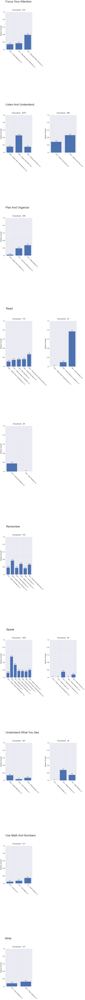

In [8]:
#Dropoff Plot by Sequence by Skill

#List of skills in order
list_of_skills=first_lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(first_lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
seq_drop_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=seq_drop_fig, height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=first_lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=seq_drop_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Relative dropoffs as bar heights
        y=seq_to_plot['rel_drop'];
        x=np.arange(len(y));
        ax.bar(x,y,w);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,0.25,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['entry_count'].iloc[0])
                     , size=25, pad=20);
        
        #Axis and tick labels
        ax.set_ylabel('Relative Dropoff', size=20, labelpad=8);
        ax.set_ylim(0,0.2);
        ax.set_yticks(np.linspace(0,0.2,6).round(2));
        ax.set_yticklabels(np.linspace(0,0.2,6).round(2), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '+
                           seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
        
        #y-labels on each bar
        for l in range(len(x)):
            ax.text(x[l],y.iloc[l]+0.003,y.iloc[l].round(2),size=14, ha='center')
            
plt.subplots_adjust(wspace=0.65, hspace=1.3)

In [9]:
#Updating accuracy analysis to exclude tasks after a drop

#Merging last events
seq_acc_data=pd.merge(seq_acc_data,patient_finals,how='left');

#Identifying the index for the drop (note indices are time-sorted to this point)
seq_acc_data['drop_index']=pd.merge(seq_acc_data,seq_acc_data[
    seq_acc_data['event_id'].fillna(-1)==seq_acc_data['last_event_id'].fillna(-2)][
    'patient_id'].reset_index(),how='left')['index'];

#Dropping everything after the drop index
seq_acc_data=seq_acc_data[
    ~(seq_acc_data.reset_index().apply(lambda x: x['index']>x['drop_index'],axis=1))];

seq_acc_data

,skill,patient_id,task_order,start_date,end_date,lid_name,lid,sequence,event_id,accuracy,latency,end_reason,total_task_count,completed_task_count,last_event_id,last_time,drop_index
0,Remember,380,1,2021-02-23 18:36:17,2021-02-23 18:36:17,Pattern Recreation Lvl 2,87.2,87.2-229.2-207.4-165.1-166.1-26.3,163333065.0,0.834,20.98,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,NaN
1,Remember,380,2,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture N-Back Memory Lvl 2,229.2,87.2-229.2-207.4-165.1-166.1-26.3,163333385.0,0.678,34.29,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,NaN
2,Remember,380,3,2021-02-23 18:36:17,2021-02-23 18:36:17,Picture Matching Lvl 4,207.4,87.2-229.2-207.4-165.1-166.1-26.3,163333629.0,0.774,137.23,tasks completed,2.0,2.0,175663994,2021-05-26 15:25:06,NaN
3,Remember,380,4,2021-02-23 18:36:17,2021-02-23 18:36:17,Spoken Short Story Lvl 1,165.1,87.2-229.2-207.4-165.1-166.1-26.3,163334460.0,0.667,12.23,tasks completed,3.0,3.0,175663994,2021-05-26 15:25:06,NaN
4,Remember,380,5,2021-02-23 18:36:17,2021-02-23 18:36:17,Voicemail Lvl 1,166.1,87.2-229.2-207.4-165.1-166.1-26.3,163334787.0,0.667,8.56,tasks completed,3.0,3.0,175663994,2021-05-26 15:25:06,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90503,Speak,483779,6,2021-07-03 19:08:31,2021-07-03 19:08:31,Read Passive Sentences Aloud Lvl 3,226.3,251.2-219.3-223.3-240.3-248.3-226.3-244.3,181349740.0,NaN,NaN,NaN,3.0,0.0,181349740,2021-07-03 19:13:17,90503.0
90505,Listen and understand,483782,1,2021-07-03 19:19:37,2021-07-03 19:19:37,Auditory Command Lvl 2,212.2,212.2-165.4,181350410.0,1.000,28.67,tasks completed,3.0,3.0,181350813,2021-07-03 19:23:50,90507.0
90506,Listen and understand,483782,2,2021-07-03 19:19:37,2021-07-03 19:19:37,Spoken Short Story Lvl 4,165.4,212.2-165.4,181350558.0,0.250,10.50,ConsecutiveItemsFail,4.0,4.0,181350813,2021-07-03 19:23:50,90507.0
90507,Read,483782,1,2021-07-03 19:23:45,2021-07-03 19:23:45,Functional Reading Lvl 3,140.3,140.3-108.3,181350813.0,0.333,31.33,NaN,4.0,3.0,181350813,2021-07-03 19:23:50,90507.0


In [10]:
#Compiling stats on individual exercises for each sequence:
#Accuracy, latency, performance binning

#Accuracy, latency, and task name
lid_stats=seq_acc_data.fillna({'accuracy':0}).groupby(['skill','sequence','lid'])[
    ['lid_name','accuracy','latency','task_order']].aggregate(
    {'lid_name': lambda x: x.value_counts().index[0], 'accuracy': np.mean,
     'latency': np.mean, 'task_order': np.mean});

#Accuracy Bins
lid_fail=seq_acc_data.fillna({'accuracy':0})[
    seq_acc_data.fillna({'accuracy':0})['accuracy']<.6].groupby(
    ['skill','sequence','lid'])['lid_name'].count();
lid_mid=seq_acc_data[(seq_acc_data['accuracy']>=.6) & (seq_acc_data['accuracy']<=.9)].groupby(
    ['skill','sequence','lid'])['lid_name'].count();
lid_pass=seq_acc_data[seq_acc_data['accuracy']>.9].groupby(
    ['skill','sequence','lid'])['lid_name'].count();
lid_stats['fail']=lid_fail;
lid_stats['middle']=lid_mid;
lid_stats['pass']=lid_pass;
lid_stats[['fail','middle','pass']]=lid_stats[['fail','middle','pass']].fillna(0);
lid_stats[['fail','middle','pass']]=lid_stats[['fail','middle','pass']].divide(
    lid_stats[['fail','middle','pass']].sum(axis=1),axis=0);

#Sequence Occurance (for sorting)
lid_stats['seq_occurance']=sequence_data['occurance'];

#Sorted alphabetically by skill name, high occurance, task order in sequence
lid_stats.sort_values(['skill','seq_occurance','task_order'],
                      inplace=True,ascending=[True,False,True]);

lid_stats

lid_name  \
skill                sequence          lid                                        
Focus your attention 259.3-215.4-148.1 259.3              Symbol Matching Lvl 3   
                                       215.4  Alternating Symbol Matching Lvl 4   
                                       148.1    Alternating Word Ordering Lvl 1   
                     259.8-215.6-148.1 259.8              Symbol Matching Lvl 8   
                                       215.6  Alternating Symbol Matching Lvl 6   
...                                                                         ...   
Use math and numbers 15.2-133.1        15.2                  Word Problem Lvl 2   
                                       133.1                   Clock Math Lvl 1   
Write                231.2-242.4       231.2                Word Spelling Lvl 2   
                                       242.4             Picture Spelling Lvl 4   
                     242.5             242.5             Picture Spelling Lvl 5   

                                              accuracy     latency  \
skill                sequence          lid                           
Focus your attention 259.3-215.4-148.1 259.3  0.834085   22.584325   
                                       215.4  0.661802   59.732325   
                                       148.1  0.621167  101.252832   
                     259.8-215.6-148.1 259.8  0.751974   25.477865   
                                       215.6  0.595876   92.999972   
...                                                ...         ...   
Use math and numbers 15.2-133.1        15.2   0.625000   56.699388   
                                       133.1  0.826396   13.377511   
Write                231.2-242.4       231.2  0.771326   50.635164   
                                       242.4  0.681056   87.069631   
                     242.5             242.5  0.767182   55.652091   

                                              task_order      fail    middle  \
skill                sequence          lid                                     
Focus your attention 259.3-215.4-148.1 259.3           1  0.130452  0.231434   
                                       215.4           2  0.363455  0.184713   
                                       148.1           3  0.375961  0.213679   
                     259.8-215.6-148.1 259.8           1  0.236842  0.289474   
                                       215.6           2  0.378378  0.216216   
...                                                  ...       ...       ...   
Use math and numbers 15.2-133.1        15.2            1  0.360000  0.320000   
                                       133.1           2  0.145833  0.208333   
Write                231.2-242.4       231.2           1  0.207602  0.190058   
                                       242.4           2  0.300587  0.275660   
                     242.5             242.5           1  0.181818  0.363636   

                                                  pass  seq_occurance  
skill                sequence          lid                             
Focus your attention 259.3-215.4-148.1 259.3  0.638114           3930  
                                       215.4  0.451831           3930  
                                       148.1  0.410360           3930  
                     259.8-215.6-148.1 259.8  0.473684             54  
                                       215.6  0.405405             54  
...                                                ...            ...  
Use math and numbers 15.2-133.1        15.2   0.320000             84  
                                       133.1  0.645833             84  
Write                231.2-242.4       231.2  0.602339           1065  
                                       242.4  0.423754           1065  
                     242.5             242.5  0.454545             45  

[63 rows x 8 columns]

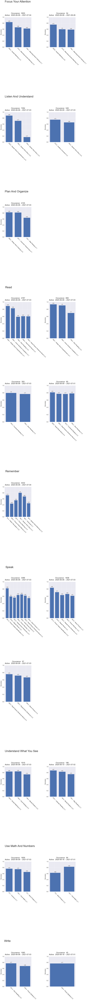

In [11]:
#Aggregate Accuracy Plot by Sequence by Skill

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
seq_acc_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=seq_acc_fig,
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=seq_acc_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Accuracies as bar heights
        y=seq_to_plot['accuracy'];
        x=np.arange(len(y));
        ax.bar(x,y,w);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.6-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=20);
        
        #Axis and tick labels
        ax.set_ylabel('Accuracy', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '+
                           seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
        
        #y-labels on each bar
        for l in range(len(x)):
            ax.text(x[l],y.iloc[l]+0.02,y.iloc[l].round(2),size=14, ha='center')
            
plt.subplots_adjust(wspace=0.65, hspace=1.3)

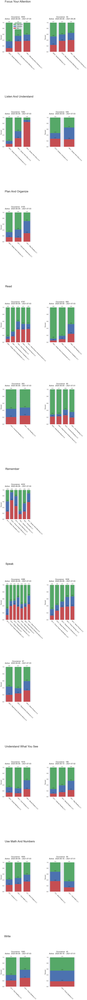

In [12]:
#Binned Performance Plot (Jason's Style) by Sequence by Skill
#Updated to exclude post-drop tasks

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
j_seq_acc_bin_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=j_seq_acc_bin_fig, 
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=j_seq_acc_bin_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Binned performance counts as bar heights
        ym=seq_to_plot['middle'];
        yp=seq_to_plot['pass'];
        yf=seq_to_plot['fail'];
        x=np.arange(len(ym));
        pm=ax.bar(x,ym,w,bottom=yf);
        pp=ax.bar(x,yp,w,bottom=yf+ym);
        pf=ax.bar(x,yf,w);
        
        #Putting legend on only the first plot
        if (j==0) & (k==0):
            ax.legend([pp,pm,pf],['high-pass','mid-pass','fail'],fontsize=18,
                      loc='upper center', frameon=True);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.8-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=45);
        
        #Axis and tick labels
        ax.set_ylabel('Percent', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '
                           +seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
        
        #y-labels on each bar
        for l in range(len(x)):
            ax.text(x[l],yf.iloc[l]+0.02,yf.iloc[l].round(2),size=14, ha='center')
            ax.text(x[l],max(yf.iloc[l]+ym.iloc[l]+0.02,yf.iloc[l]+0.08),ym.iloc[l].round(2),
                    size=14, ha='center')
            ax.text(x[l]
                ,max(yf.iloc[l]+ym.iloc[l]+yp.iloc[l]+0.02,
                     yf.iloc[l]+ym.iloc[l]+0.08,yf.iloc[l]+0.14),
                yp.iloc[l].round(2),size=14, ha='center')
            
plt.subplots_adjust(wspace=0.65, hspace=1.35)

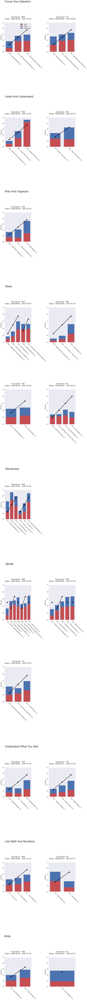

In [13]:
#Task Failure Rate by Sequence with Ideal Trajectory Overlay

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
fail_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=fail_fig, 
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=fail_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Failures as bar heights
        yf=seq_to_plot['fail'];
        ym=seq_to_plot['middle']
        x=np.arange(len(yf));
        pf=ax.bar(x,yf,w,color=sns.color_palette()[2],label='Failed');
        pm=ax.bar(x,ym,w,color=sns.color_palette()[0],label='Challenged',bottom=yf);
        
        #Ideal Fail Progression Overlay
        y_ideal=(x+1)/(len(x)+1);
        #Special cases with domain changes
        if (j==3) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x[-2:],y_ideal2,'-ok',linewidth=4,markersize=15);
        if (j==4) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4]);
            y_ideal2=np.array([1/4,2/4,3/4]);
            ax.plot(x[-3:],y_ideal2,'-ok',linewidth=4,markersize=15);
        if (j==5) & (k==0):
            y_ideal=np.array([1/2]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x[1:3],y_ideal2,'-ok',linewidth=4,markersize=15);
            y_ideal3=np.array([1/2]);
            ax.plot(x[3],y_ideal3,'-ok',linewidth=4,markersize=15);
            y_ideal4=np.array([1/3,2/3]);
            ax.plot(x[4:6],y_ideal4,'-ok',linewidth=4,markersize=15);
            y_ideal5=np.array([1/2]);
            ax.plot(x[-1],y_ideal5,'-ok',linewidth=4,markersize=15)
        if (j==5) & (k==1):
            y_ideal=np.array([1/2]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x[1:3],y_ideal2,'-ok',linewidth=4,markersize=15);
            y_ideal3=np.array([1/2]);
            ax.plot(x[3],y_ideal3,'-ok',linewidth=4,markersize=15);
            y_ideal4=np.array([1/2]);
            ax.plot(x[4],y_ideal4,'-ok',linewidth=4,markersize=15);
        
        pi=ax.plot(x[0:len(y_ideal)],y_ideal,'-ok',linewidth=4,markersize=15,label='Ideal');
        
        #Putting legend on only the first plot
        if (j==0) & (k==0):
            ax.legend(fontsize=18);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.8-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=45);
        
        #Axis and tick labels
        ax.set_ylabel('Percent', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '
                           +seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
            
plt.subplots_adjust(wspace=0.65, hspace=1.35)

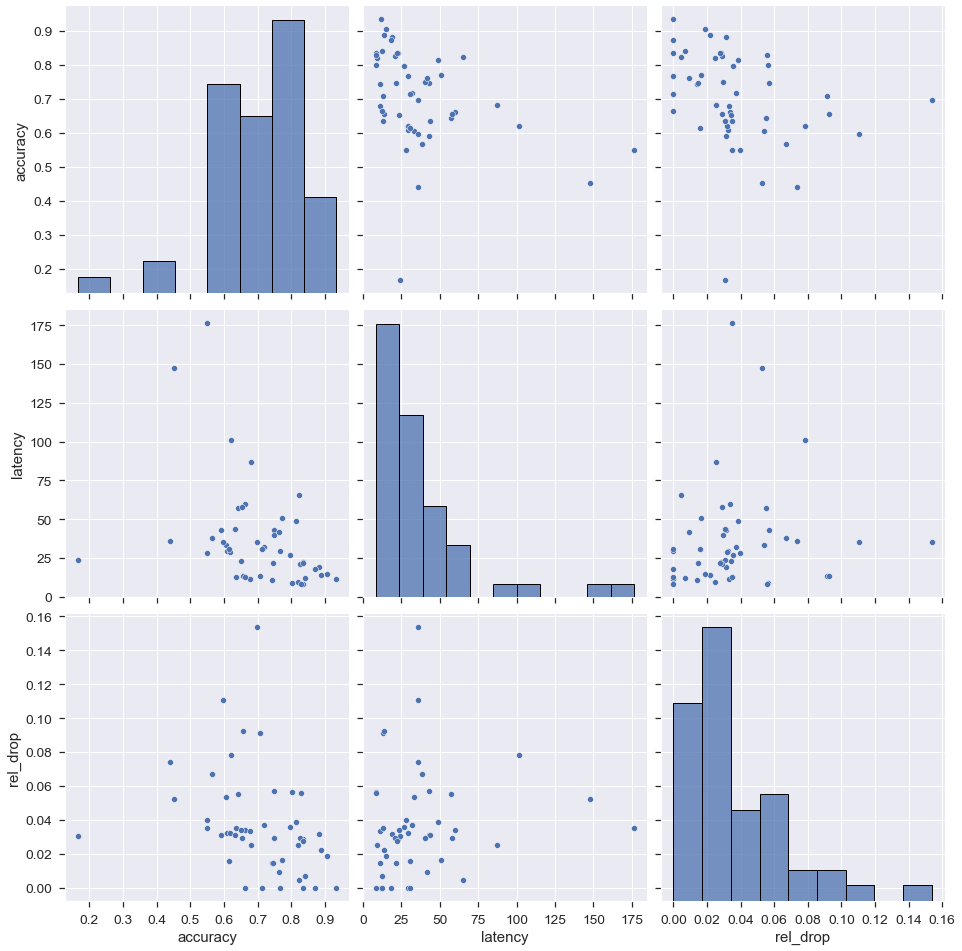

In [14]:
#Compiling accuracies, latencies, and drops to examine correlations

correlation_data=lid_stats.join(first_lid_stats['rel_drop']).dropna()[[
    'accuracy','latency','rel_drop']];

#Plot of each relationship, they are weakly correlated with the expected behaviors

with sns.plotting_context("notebook",font_scale=1.25):
    sns.pairplot(correlation_data,height=4.5);

In [15]:
#Computing average accuracy and latency for each task among drops and the rest

dropped_data=seq_acc_data.reset_index()[seq_acc_data.reset_index()['index']==
                           seq_acc_data.reset_index()['drop_index']].set_index('index');
undropped_data=seq_acc_data.reset_index()[~(seq_acc_data.reset_index()['index']==
                           seq_acc_data.reset_index()['drop_index'])].set_index('index');

lid_stats['dropped_accuracy']=dropped_data.fillna(0).groupby(
    ['skill','sequence','lid'])['accuracy'].mean();
lid_stats['undropped_accuracy']=undropped_data.fillna(0).groupby(
    ['skill','sequence','lid'])['accuracy'].mean();
lid_stats['drop_rel_accuracy']=lid_stats['dropped_accuracy']/lid_stats['undropped_accuracy'];

lid_stats['dropped_latency']=dropped_data.groupby(
    ['skill','sequence','lid'])['latency'].mean();
lid_stats['undropped_latency']=undropped_data.groupby(
    ['skill','sequence','lid'])['latency'].mean();
lid_stats['drop_rel_latency']=lid_stats['dropped_latency']/lid_stats['undropped_latency'];

lid_stats['drop_count']=dropped_data.groupby(['skill','sequence','lid'])['patient_id'].count();

lid_stats['rel_drop']=lid_stats['drop_count']/lid_stats.join(
    lid_stats.groupby(['skill','sequence'])['drop_count'].sum().rename('tot_drop'))['tot_drop'];

lid_stats

lid_name  \
skill                sequence          lid                                        
Focus your attention 259.3-215.4-148.1 259.3              Symbol Matching Lvl 3   
                                       215.4  Alternating Symbol Matching Lvl 4   
                                       148.1    Alternating Word Ordering Lvl 1   
                     259.8-215.6-148.1 259.8              Symbol Matching Lvl 8   
                                       215.6  Alternating Symbol Matching Lvl 6   
...                                                                         ...   
Use math and numbers 15.2-133.1        15.2                  Word Problem Lvl 2   
                                       133.1                   Clock Math Lvl 1   
Write                231.2-242.4       231.2                Word Spelling Lvl 2   
                                       242.4             Picture Spelling Lvl 4   
                     242.5             242.5             Picture Spelling Lvl 5   

                                              accuracy     latency  \
skill                sequence          lid                           
Focus your attention 259.3-215.4-148.1 259.3  0.834085   22.584325   
                                       215.4  0.661802   59.732325   
                                       148.1  0.621167  101.252832   
                     259.8-215.6-148.1 259.8  0.751974   25.477865   
                                       215.6  0.595876   92.999972   
...                                                ...         ...   
Use math and numbers 15.2-133.1        15.2   0.625000   56.699388   
                                       133.1  0.826396   13.377511   
Write                231.2-242.4       231.2  0.771326   50.635164   
                                       242.4  0.681056   87.069631   
                     242.5             242.5  0.767182   55.652091   

                                              task_order      fail    middle  \
skill                sequence          lid                                     
Focus your attention 259.3-215.4-148.1 259.3           1  0.130452  0.231434   
                                       215.4           2  0.363455  0.184713   
                                       148.1           3  0.375961  0.213679   
                     259.8-215.6-148.1 259.8           1  0.236842  0.289474   
                                       215.6           2  0.378378  0.216216   
...                                                  ...       ...       ...   
Use math and numbers 15.2-133.1        15.2            1  0.360000  0.320000   
                                       133.1           2  0.145833  0.208333   
Write                231.2-242.4       231.2           1  0.207602  0.190058   
                                       242.4           2  0.300587  0.275660   
                     242.5             242.5           1  0.181818  0.363636   

                                                  pass  seq_occurance  \
skill                sequence          lid                              
Focus your attention 259.3-215.4-148.1 259.3  0.638114           3930   
                                       215.4  0.451831           3930   
                                       148.1  0.410360           3930   
                     259.8-215.6-148.1 259.8  0.473684             54   
                                       215.6  0.405405             54   
...                                                ...            ...   
Use math and numbers 15.2-133.1        15.2   0.320000             84   
                                       133.1  0.645833             84   
Write                231.2-242.4       231.2  0.602339           1065   
                                       242.4  0.423754           1065   
                     242.5             242.5  0.454545             45   

                                              dropped_accuracy  \
skill                se

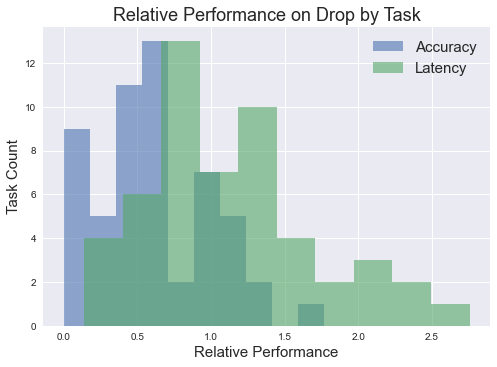

In [16]:
#Relative accuracies and latencies of a dropout aggregated by task

ax = plt.axes();
ax.hist(lid_stats['drop_rel_accuracy'],alpha=0.6,histtype='stepfilled',label='Accuracy');
ax.hist(lid_stats['drop_rel_latency'],alpha=0.6,histtype='stepfilled',label='Latency');
ax.set_title('Relative Performance on Drop by Task',size=18);
ax.set_xlabel('Relative Performance',size=15);
ax.set_ylabel('Task Count',size=15);
ax.legend(fontsize=15);

In [17]:
#Finding relative drop rate on each task

dropped_data=pd.merge(dropped_data,
                      lid_stats[['undropped_accuracy','undropped_latency']].reset_index()
                      ,how='left');

dropped_data['drop_rel_accuracy']=dropped_data['accuracy'
                                              ].fillna(0)/dropped_data['undropped_accuracy'];
dropped_data['drop_rel_latency']=dropped_data['latency'
                                              ]/dropped_data['undropped_latency'];
    
dropped_data

,skill,patient_id,task_order,start_date,end_date,lid_name,lid,sequence,event_id,accuracy,...,end_reason,total_task_count,completed_task_count,last_event_id,last_time,drop_index,undropped_accuracy,undropped_latency,drop_rel_accuracy,drop_rel_latency
0,Read,975,3,2021-07-01 20:54:57,2021-07-01 20:54:57,Short Reading Lvl 2,108.2,256.1-208.1-108.2-248.4-226.3,181131191.0,0.000,...,NaN,3.0,1.0,181131191,2021-07-01 20:56:35,14.0,0.602133,43.078289,0.000000,0.808203
1,Write,97781,2,2021-01-16 01:34:59,2021-01-16 01:34:59,Picture Spelling Lvl 4,242.4,231.2-242.4,159773432.0,NaN,...,NaN,2.0,0.0,159773432,2021-01-23 01:10:52,142.0,0.685074,87.246672,0.000000,NaN
2,Use math and numbers,174969,3,2020-12-08 15:36:48,2020-12-08 15:36:48,Word Problem Lvl 1,15.1,43.1-133.1-15.1,155153378.0,NaN,...,NaN,4.0,0.0,155153378,2020-12-08 17:40:15,350.0,0.657816,57.612359,0.000000,NaN
3,Speak,275307,5,2021-07-02 11:04:24,2021-07-02 11:04:24,Read Words Aloud Lvl 3,248.3,251.2-219.3-223.3-240.3-248.3-226.3-244.3,181174283.0,NaN,...,NaN,3.0,0.0,181174283,2021-07-02 11:11:07,525.0,0.662238,23.275916,0.000000,NaN
4,Speak,275353,3,2021-06-24 20:46:56,2021-06-24 20:46:56,Repeat Active Sentences Lvl 3,223.3,251.2-219.3-223.3-240.3-244.3,180061001.0,NaN,...,NaN,3.0,0.0,180061001,2021-06-24 20:49:45,812.0,0.636326,43.464730,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2302,Speak,483770,3,2021-07-03 20:59:14,2021-07-03 20:59:14,Repeat Active Sentences Lvl 3,223.3,251.2-219.3-223.3-240.3-248.3-226.3-244.3,181358456.0,1.000,...,NaN,3.0,2.0,181358456,2021-07-03 21:02:08,90475.0,0.584950,37.819511,1.709546,3.834000
2303,Speak,483777,2,2021-07-03 18:37:21,2021-07-03 18:37:21,Repeat Words Lvl 3,219.3,251.2-219.3-223.3-240.3-248.3-226.3-244.3,181375032.0,NaN,...,NaN,3.0,0.0,181375032,2021-07-04 01:37:15,90489.0,0.627496,35.437957,0.000000,NaN
2304,Speak,483779,6,2021-07-03 19:08:31,2021-07-03 19:08:31,Read Passive Sentences Aloud Lvl 3,226.3,251.2-219.3-223.3-240.3-248.3-226.3-244.3,181349740.0,NaN,...,NaN,3.0,0.0,181349740,2021-07-03 19:13:17,90503.0,0.629106,28.906489,0.000000,NaN
2305,Read,483782,1,2021-07-03 19:23:45,2021-07-03 19:23:45,Functional Reading Lvl 3,140.3,140.3-108.3,181350813.0,0.333,...,NaN,4.0,3.0,181350813,2021-07-03 19:23:50,90507.0,0.799451,26.845966,0.416536,1.167028


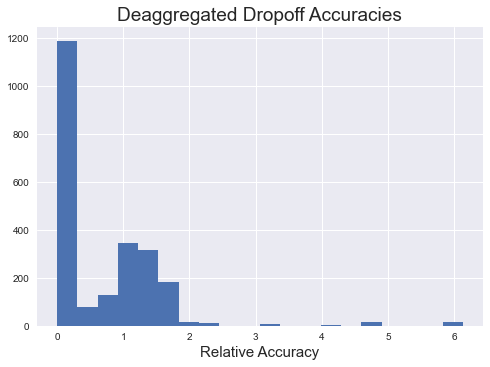

In [18]:
#Histogram of reltaive accuracies on dropoff without task aggregation

plt.hist(dropped_data['drop_rel_accuracy'],histtype='stepfilled',bins=20);
plt.title('Deaggregated Dropoff Accuracies',size=19);
plt.xlabel('Relative Accuracy',size=15);

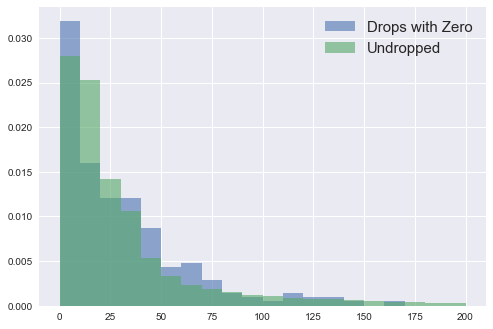

In [19]:
#Latency histograms for dropped and undropped data, suggesting that there is no
#one latency value that distinguishes the two.

ax=plt.axes();
ax.hist(dropped_data.latency.dropna()[dropped_data.fillna(0)['accuracy']==0],
        bins=20,range=(0,200),alpha=0.6,label='Drops with Zero',density=True);
ax.hist(undropped_data.latency.dropna(),
        bins=20,range=(0,200),alpha=0.6,label='Undropped',density=True);
ax.legend(fontsize=15);

In [20]:
#Finding tasks with high rate of 0's on drop

lid_stats['zero_on_drop']=dropped_data.fillna(0)[dropped_data.fillna(0)['accuracy']==0].groupby(
    ['skill','sequence','lid'])['patient_id'].count()/lid_stats['drop_count'];

lid_stats

lid_name  \
skill                sequence          lid                                        
Focus your attention 259.3-215.4-148.1 259.3              Symbol Matching Lvl 3   
                                       215.4  Alternating Symbol Matching Lvl 4   
                                       148.1    Alternating Word Ordering Lvl 1   
                     259.8-215.6-148.1 259.8              Symbol Matching Lvl 8   
                                       215.6  Alternating Symbol Matching Lvl 6   
...                                                                         ...   
Use math and numbers 15.2-133.1        15.2                  Word Problem Lvl 2   
                                       133.1                   Clock Math Lvl 1   
Write                231.2-242.4       231.2                Word Spelling Lvl 2   
                                       242.4             Picture Spelling Lvl 4   
                     242.5             242.5             Picture Spelling Lvl 5   

                                              accuracy     latency  \
skill                sequence          lid                           
Focus your attention 259.3-215.4-148.1 259.3  0.834085   22.584325   
                                       215.4  0.661802   59.732325   
                                       148.1  0.621167  101.252832   
                     259.8-215.6-148.1 259.8  0.751974   25.477865   
                                       215.6  0.595876   92.999972   
...                                                ...         ...   
Use math and numbers 15.2-133.1        15.2   0.625000   56.699388   
                                       133.1  0.826396   13.377511   
Write                231.2-242.4       231.2  0.771326   50.635164   
                                       242.4  0.681056   87.069631   
                     242.5             242.5  0.767182   55.652091   

                                              task_order      fail    middle  \
skill                sequence          lid                                     
Focus your attention 259.3-215.4-148.1 259.3           1  0.130452  0.231434   
                                       215.4           2  0.363455  0.184713   
                                       148.1           3  0.375961  0.213679   
                     259.8-215.6-148.1 259.8           1  0.236842  0.289474   
                                       215.6           2  0.378378  0.216216   
...                                                  ...       ...       ...   
Use math and numbers 15.2-133.1        15.2            1  0.360000  0.320000   
                                       133.1           2  0.145833  0.208333   
Write                231.2-242.4       231.2           1  0.207602  0.190058   
                                       242.4           2  0.300587  0.275660   
                     242.5             242.5           1  0.181818  0.363636   

                                                  pass  seq_occurance  \
skill                sequence          lid                              
Focus your attention 259.3-215.4-148.1 259.3  0.638114           3930   
                                       215.4  0.451831           3930   
                                       148.1  0.410360           3930   
                     259.8-215.6-148.1 259.8  0.473684             54   
                                       215.6  0.405405             54   
...                                                ...            ...   
Use math and numbers 15.2-133.1        15.2   0.320000             84   
                                       133.1  0.645833             84   
Write                231.2-242.4       231.2  0.602339           1065   
                                       242.4  0.423754           1065   
                     242.5             242.5  0.454545             45   

                                              dropped_accuracy  \
skill                se

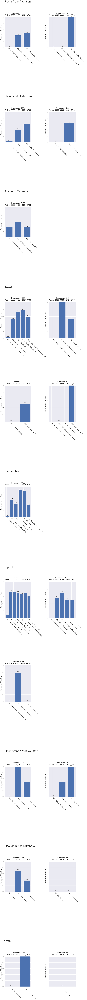

In [21]:
#Percentage of dropoffs with 0's by task

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
zeros_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=zeros_fig,
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=zeros_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Accuracies as bar heights
        y=seq_to_plot['zero_on_drop'].fillna(0);
        x=np.arange(len(y));
        ax.bar(x,y,w);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.6-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=20);
        
        #Axis and tick labels
        ax.set_ylabel('Percentage of 0 on Drop', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '+
                           seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
        
        #y-labels on each bar
        for l in range(len(x)):
            ax.text(x[l],y.iloc[l]+0.02,y.iloc[l].round(2),size=14, ha='center')
            
plt.subplots_adjust(wspace=0.65, hspace=1.3)

In [22]:
lid_stats=lid_stats.join(dropped_data.groupby(['skill','sequence','lid'])[
    ['total_task_count','completed_task_count']].aggregate(
    {'total_task_count':'max','completed_task_count':'mean'}));

lid_stats['drop_completion']=lid_stats['completed_task_count']/lid_stats['total_task_count'];

lid_stats

lid_name  \
skill                sequence          lid                                        
Focus your attention 259.3-215.4-148.1 259.3              Symbol Matching Lvl 3   
                                       215.4  Alternating Symbol Matching Lvl 4   
                                       148.1    Alternating Word Ordering Lvl 1   
                     259.8-215.6-148.1 259.8              Symbol Matching Lvl 8   
                                       215.6  Alternating Symbol Matching Lvl 6   
...                                                                         ...   
Use math and numbers 15.2-133.1        15.2                  Word Problem Lvl 2   
                                       133.1                   Clock Math Lvl 1   
Write                231.2-242.4       231.2                Word Spelling Lvl 2   
                                       242.4             Picture Spelling Lvl 4   
                     242.5             242.5             Picture Spelling Lvl 5   

                                              accuracy     latency  \
skill                sequence          lid                           
Focus your attention 259.3-215.4-148.1 259.3  0.834085   22.584325   
                                       215.4  0.661802   59.732325   
                                       148.1  0.621167  101.252832   
                     259.8-215.6-148.1 259.8  0.751974   25.477865   
                                       215.6  0.595876   92.999972   
...                                                ...         ...   
Use math and numbers 15.2-133.1        15.2   0.625000   56.699388   
                                       133.1  0.826396   13.377511   
Write                231.2-242.4       231.2  0.771326   50.635164   
                                       242.4  0.681056   87.069631   
                     242.5             242.5  0.767182   55.652091   

                                              task_order      fail    middle  \
skill                sequence          lid                                     
Focus your attention 259.3-215.4-148.1 259.3           1  0.130452  0.231434   
                                       215.4           2  0.363455  0.184713   
                                       148.1           3  0.375961  0.213679   
                     259.8-215.6-148.1 259.8           1  0.236842  0.289474   
                                       215.6           2  0.378378  0.216216   
...                                                  ...       ...       ...   
Use math and numbers 15.2-133.1        15.2            1  0.360000  0.320000   
                                       133.1           2  0.145833  0.208333   
Write                231.2-242.4       231.2           1  0.207602  0.190058   
                                       242.4           2  0.300587  0.275660   
                     242.5             242.5           1  0.181818  0.363636   

                                                  pass  seq_occurance  \
skill                sequence          lid                              
Focus your attention 259.3-215.4-148.1 259.3  0.638114           3930   
                                       215.4  0.451831           3930   
                                       148.1  0.410360           3930   
                     259.8-215.6-148.1 259.8  0.473684             54   
                                       215.6  0.405405             54   
...                                                ...            ...   
Use math and numbers 15.2-133.1        15.2   0.320000             84   
                                       133.1  0.645833             84   
Write                231.2-242.4       231.2  0.602339           1065   
                                       242.4  0.423754           1065   
                     242.5             242.5  0.454545             45   

                                              dropped_accuracy  \
skill                se

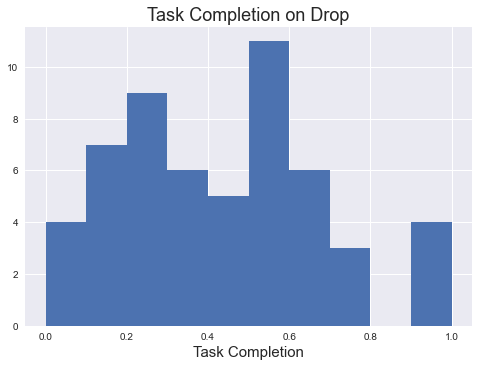

In [23]:
#Histogram of how far users get on average through a task that causes a drop
#(Aggregated by task)

plt.hist(lid_stats['drop_completion']);
plt.xlabel('Task Completion',size=15);
plt.title('Task Completion on Drop',size=18);

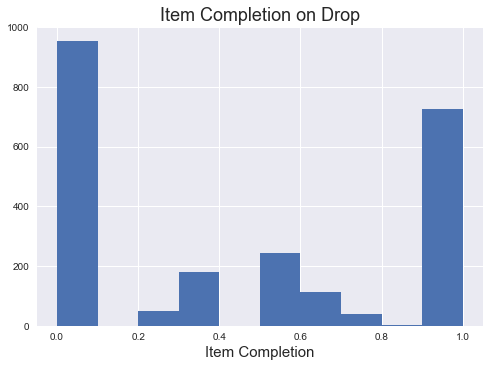

In [24]:
#Histogram of how far users get on average through a task that causes a drop
#Deaggregated to individual performances

plt.hist((dropped_data['completed_task_count']/dropped_data['total_task_count']).dropna());
plt.xlabel('Item Completion',size=15);
plt.title('Item Completion on Drop',size=18);

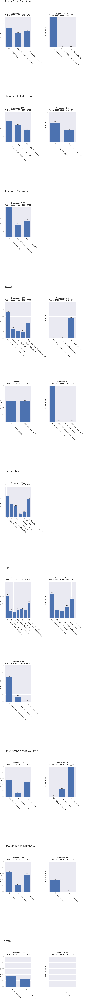

In [25]:
#Task Completion on Drop by task (averages aggregated by task)

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
drop_completion_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=drop_completion_fig,
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=drop_completion_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Accuracies as bar heights
        y=seq_to_plot['drop_completion'].fillna(0);
        x=np.arange(len(y));
        ax.bar(x,y,w);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.6-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=20);
        
        #Axis and tick labels
        ax.set_ylabel('Task Completion', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '+
                           seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
        
        #y-labels on each bar
        for l in range(len(x)):
            ax.text(x[l],y.iloc[l]+0.02,y.iloc[l].round(2),size=14, ha='center')
            
plt.subplots_adjust(wspace=0.65, hspace=1.3)

In [26]:
#Identifying rates at which people drop with 0/100% of items completed

zero_item_drop=dropped_data[dropped_data['completed_task_count']==0].groupby(
    ['skill','sequence','lid'])['completed_task_count'].count();
zero_item_drop.name='zero_item_drop';
full_item_drop=dropped_data[dropped_data['completed_task_count']==
                            dropped_data['total_task_count']].groupby(
                            ['skill','sequence','lid'])['completed_task_count'].count();
full_item_drop.name='full_item_drop';

lid_stats=lid_stats.join(zero_item_drop);
lid_stats=lid_stats.join(full_item_drop);

lid_stats['rel_zero_item_drop']=lid_stats['zero_item_drop'].fillna(0)/lid_stats['drop_count'];
lid_stats['rel_full_item_drop']=lid_stats['full_item_drop'].fillna(0)/lid_stats['drop_count'];

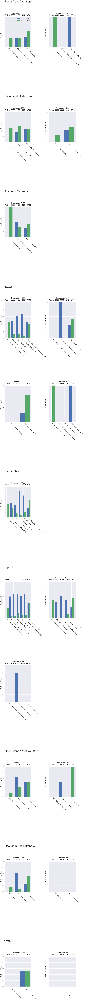

In [27]:
#Zero/Full Item Completion on Drop by task

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
drop_completion_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=drop_completion_fig,
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=drop_completion_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Accuracies as bar heights
        y1=seq_to_plot['rel_zero_item_drop'].fillna(0);
        y2=seq_to_plot['rel_full_item_drop'].fillna(0);
        x=np.arange(len(y1));
        ax.bar(x-w/4,y1,w/2,label='Drops with 0%');
        ax.bar(x+w/4,y2,w/2,label='Drops with 100%');
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.6-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Putting legend on only the first plot
        if (j==0) & (k==0):
            ax.legend(fontsize=18);
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=20);
        
        #Axis and tick labels
        ax.set_ylabel('Task Completion', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(x-w/20*len(x));
        ax.set_xticklabels(seq_to_plot.reset_index()['lid'].astype('string')+' - '+
                           seq_to_plot.reset_index()['lid_name'],
                            size=18, rotation=-45, ha='left');
            
plt.subplots_adjust(wspace=0.65, hspace=1.3)

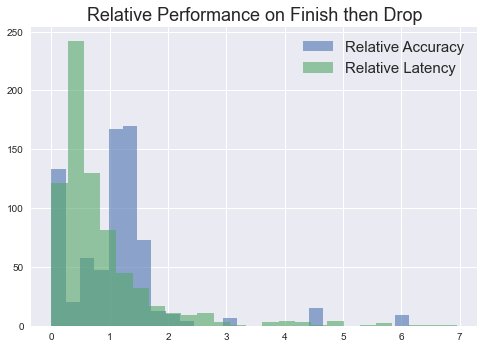

In [28]:
#Histogram of relative latencies and accuracies for users who finish a task and drop

plt.hist(dropped_data[dropped_data['completed_task_count']==dropped_data['total_task_count']][
    'drop_rel_accuracy'],bins=25,alpha=0.6,label='Relative Accuracy');
plt.hist(dropped_data[dropped_data['completed_task_count']==dropped_data['total_task_count']][
    'drop_rel_latency'],bins=25,alpha=0.6,label='Relative Latency');
plt.legend(fontsize=15);
plt.title('Relative Performance on Finish then Drop',size=18);

In [29]:
#Evaluating ideal failure rate and errors wrt that rate for each sequence

chal_func=lid_stats[['fail','middle']];

ideal=np.array([]);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        x=np.arange(len(seq_to_plot['fail']));
        
        #Ideal Fail Progression Overlay
        y_ideal=(x+1)/(len(x)+1);
        #Special cases with domain changes
        if (j==3) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4,1/3,2/3]);
        if (j==4) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4,1/4,2/4,3/4]);
        if (j==5) & (k==0):
            y_ideal=np.array([1/2,1/3,2/3,1/2,1/3,2/3,1/2]);
        if (j==5) & (k==1):
            y_ideal=np.array([1/2,1/3,2/3,1/2,1/2]);
            
        ideal=np.concatenate([ideal,y_ideal]);
        
chal_func['ideal']=ideal;
chal_func['sq_error']=(chal_func['ideal']-chal_func['fail'])**2;
chal_func['abs_error']=abs(chal_func['ideal']-chal_func['fail']);
chal_func['sign_error']=chal_func['fail']-chal_func['ideal'];

seq_error=chal_func.groupby(['skill','sequence'])[['sq_error','abs_error','sign_error']].mean();
seq_error['rms_error']=np.sqrt(seq_error['sq_error']);

seq_error

<ipython-input-29-abd1ff95459c>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chal_func['ideal']=ideal;
<ipython-input-29-abd1ff95459c>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chal_func['sq_error']=(chal_func['ideal']-chal_func['fail'])**2;
<ipython-input-29-abd1ff95459c>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

sq_error  \
skill                   sequence                                              
Focus your attention    259.3-215.4-148.1                          0.057614   
                        259.8-215.6-148.1                          0.044570   
Listen and understand   212.2-165.4                                0.085284   
                        238.3-165.2-165.4                          0.024885   
Plan and organize       206.4-237.1-132.1                          0.115935   
Read                    140.3-108.3                                0.096137   
                        248.4-226.3-140.3-108.3                    0.128850   
                        256.1-208.1-108.2                          0.154732   
                        256.1-208.1-108.2-248.4-226.3              0.071396   
Remember                87.2-229.2-207.4-165.1-166.1-26.3          0.033451   
Speak                   226.3-223.3-244.3                          0.083014   
                        251.2-219.3-223.3-240.3-244.3              0.053870   
                        251.2-219.3-223.3-240.3-248.3-226.3-244.3  0.042022   
Understand what you see 216.1-136.4-132.1                          0.137045   
                        259.3-130.2-136.4                          0.133398   
Use math and numbers    15.2-133.1                                 0.135989   
                        43.1-133.1-15.1                            0.074612   
Write                   231.2-242.4                                0.074911   
                        242.5                                      0.101240   

                                                                   abs_error  \
skill                   sequence                                               
Focus your attention    259.3-215.4-148.1                           0.210044   
                        259.8-215.6-148.1                           0.159791   
Listen and understand   212.2-165.4                                 0.233756   
                        238.3-165.2-165.4                           0.151076   
Plan and organize       206.4-237.1-132.1                           0.303650   
Read                    140.3-108.3                                 0.273671   
                        248.4-226.3-140.3-108.3                     0.285333   
                        256.1-208.1-108.2                           0.371246   
                        256.1-208.1-108.2-248.4-226.3               0.236293   
Remember                87.2-229.2-207.4-165.1-166.1-26.3           0.155585   
Speak                   226.3-223.3-244.3                           0.244243   
                        251.2-219.3-223.3-240.3-244.3               0.198748   
                        251.2-219.3-223.3-240.3-248.3-226.3-244.3   0.161117   
Understand what you see 216.1-136.4-132.1                           0.336029   
                        259.3-130.2-136.4                           0.327941   
Use math and numbers    15.2-133.1                                  0.273750   
                        43.1-133.1-15.1                             0.223221   
Write                   231.2-242.4                                 0.245906   
                        242.5                                       0.318182   

                                                                   sign_error  \
skill                   sequence                                                
Focus your attention    259.3-215.4-148.1                           -0.210044   
                        259.8-215.6-148.1                           -0.159791   
Listen and understand   212.2-165.4                                 -0.233756   
                        238.3-165.2-165.4                           -0.086653   
Plan and organize       206.4-237.1-132.1                           -0.303650   
Read                    140.3-108.3                                 -0.273671   
                        248.4-226.3-140.3-108.3                     -0.275958 

In [30]:
#Loading the full set of therapy sessions

tpy_sched_data=pd.read_csv('first_tpy_sched_v2.csv');
tpy_sched_data.rename(columns={'description':'skill'},inplace=True);
tpy_sched_data['start_time']=pd.to_datetime(tpy_sched_data['start_time']);
tpy_sched_data['end_time']=pd.to_datetime(tpy_sched_data['end_time']);

tpy_sched_data

,sess_id,patient_id,first_sched_id,root_id,task_level,skill,start_time,end_time,total_task_count,completed_task_count,accuracy,latency,end_reason,active
0,30657910,483780,2056248,27,6,Focus your attention,2021-07-03 19:25:19,2021-07-03 19:36:36,2,2,0.156,680.50,tasks completed,1
1,30657910,483780,2056248,27,6,Understand what you see,2021-07-03 19:25:19,2021-07-03 19:36:36,2,2,0.156,680.50,tasks completed,1
2,30657911,483780,2056248,17,1,Read,2021-07-03 19:37:48,2021-07-03 19:39:11,3,3,0.667,46.33,tasks completed,1
3,30657912,483780,2056248,47,1,Focus your attention,2021-07-03 19:40:19,2021-07-03 19:41:53,3,3,0.283,47.00,tasks completed,1
4,30657912,483780,2056248,47,1,Remember,2021-07-03 19:40:19,2021-07-03 19:41:53,3,3,0.283,47.00,tasks completed,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107260,28652797,13063,25833,13,2,Use math and numbers,2021-02-24 17:44:59,2021-02-24 17:45:35,3,3,0.000,21.94,tasks completed,0
107261,28652798,13063,25833,15,3,Read,2021-02-24 17:46:59,2021-02-25 17:14:36,3,3,0.667,59.01,tasks completed,0
107262,28652798,13063,25833,15,3,Use math and numbers,2021-02-24 17:46:59,2021-02-25 17:14:36,3,3,0.667,59.01,tasks completed,0
107263,28652799,13063,25833,44,2,Listen and understand,2021-02-25 17:15:26,2021-02-25 17:16:13,3,3,0.833,17.37,tasks completed,0


In [31]:
#Determining Accuracy Bins
tpy_sched_data['failed']=(tpy_sched_data['accuracy'].fillna(0)<0.6).astype('int');
tpy_sched_data['challenged']=((tpy_sched_data['accuracy']>=0.6) &
                              (tpy_sched_data['accuracy']<0.9)).astype('int');
tpy_sched_data['passed']=(tpy_sched_data['accuracy']>=0.9).astype('int');

#Identifying Drops
tpy_sched_data['dropped']=((tpy_sched_data['active']==1) 
 & ((tpy_sched_data['end_time'].max()-tpy_sched_data['start_time']).astype("timedelta64[D]")>7)
    ).astype('int');

#Merging in sequences and sequence dates
tpy_sched_data=pd.merge(tpy_sched_data,pat_seq,left_on=['patient_id','skill'],
                        right_index=True, how='inner');

#Filtering out skills not yet assessed
tpy_sched_data=tpy_sched_data[tpy_sched_data['start_time']>tpy_sched_data['seq_date']];

#Flagging first start time for identifying drops
tpy_sched_data=pd.merge(tpy_sched_data,tpy_sched_data.groupby('patient_id')['start_time'
            ].first().rename('first_start_time'),left_on='patient_id',right_index=True);

tpy_sched_data

,sess_id,patient_id,first_sched_id,root_id,task_level,skill,start_time,end_time,total_task_count,completed_task_count,...,latency,end_reason,active,failed,challenged,passed,dropped,sequence,seq_date,first_start_time
13,30658321,483739,2055791,97,2,Speak,2021-07-03 19:47:34,2021-07-03 19:51:48,10,10,...,28.22,tasks completed,1,0,1,0,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2021-07-03 03:10:21,2021-07-03 19:47:34
15,30658322,483739,2055791,193,1,Speak,2021-07-03 19:53:59,2021-07-03 19:55:59,6,6,...,33.00,tasks completed,1,0,0,1,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2021-07-03 03:10:21,2021-07-03 19:47:34
16,30658323,483739,2055791,2,2,Speak,2021-07-03 19:46:45,NaT,10,0,...,NaN,NaN,1,1,0,0,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2021-07-03 03:10:21,2021-07-03 19:47:34
17,30658324,483739,2055791,81,1,Speak,2021-07-03 19:46:45,NaT,6,0,...,NaN,NaN,1,1,0,0,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2021-07-03 03:10:21,2021-07-03 19:47:34
19,30658325,483739,2055791,4,2,Speak,2021-07-03 19:46:45,NaT,10,0,...,NaN,NaN,1,1,0,0,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2021-07-03 03:10:21,2021-07-03 19:47:34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103840,27764715,360064,1833141,19,3,Speak,2020-12-26 22:26:26,2020-12-26 22:31:00,10,10,...,28.51,tasks completed,0,0,0,1,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2020-12-26 22:13:22,2020-12-26 22:26:26
103842,27764716,360064,1833141,193,1,Speak,2020-12-28 02:40:32,2020-12-28 02:46:09,6,6,...,73.00,tasks completed,0,0,0,1,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2020-12-26 22:13:22,2020-12-26 22:26:26
103843,27764717,360064,1833141,2,3,Speak,2020-12-28 02:47:08,2020-12-28 02:50:26,10,10,...,16.00,tasks completed,0,0,1,0,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2020-12-26 22:13:22,2020-12-26 22:26:26
103844,27764718,360064,1833141,81,1,Speak,2020-12-28 02:51:27,2020-12-28 02:54:56,6,6,...,40.50,tasks completed,0,0,0,1,0,251.2-219.3-223.3-240.3-248.3-226.3-244.3,2020-12-26 22:13:22,2020-12-26 22:26:26


In [32]:
#Therapy stats for each sequence

#Drop rate and occurance
seq_tpy_stats=seq_error.join(tpy_sched_data.groupby(['skill','sequence','patient_id'])['dropped'
    ].max().groupby(['skill','sequence']).aggregate(['mean','count']).rename(
    columns={'mean':'dropped','count':'tpy_count'})).fillna({'tpy_count':0});

#Accuracy bins - note this analysis ignores tasks after a drop
seq_tpy_stats=seq_tpy_stats.join(tpy_sched_data[
    tpy_sched_data['start_time']>=tpy_sched_data['first_start_time']].groupby(
    ['skill','sequence','patient_id'])[['failed','challenged','passed']].mean().groupby(
    ['skill','sequence']).mean());

#Including the sequence occurance in assessment and sorting
seq_tpy_stats=seq_tpy_stats.join(sequence_data['occurance'].rename('assess_count'));
seq_tpy_stats.sort_values(['skill','assess_count'],inplace=True,ascending=[True,False]);

seq_tpy_stats

sq_error  \
skill                   sequence                                              
Focus your attention    259.3-215.4-148.1                          0.057614   
                        259.8-215.6-148.1                          0.044570   
Listen and understand   238.3-165.2-165.4                          0.024885   
                        212.2-165.4                                0.085284   
Plan and organize       206.4-237.1-132.1                          0.115935   
Read                    256.1-208.1-108.2-248.4-226.3              0.071396   
                        256.1-208.1-108.2                          0.154732   
                        140.3-108.3                                0.096137   
                        248.4-226.3-140.3-108.3                    0.128850   
Remember                87.2-229.2-207.4-165.1-166.1-26.3          0.033451   
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3  0.042022   
                        251.2-219.3-223.3-240.3-244.3              0.053870   
                        226.3-223.3-244.3                          0.083014   
Understand what you see 259.3-130.2-136.4                          0.133398   
                        216.1-136.4-132.1                          0.137045   
Use math and numbers    43.1-133.1-15.1                            0.074612   
                        15.2-133.1                                 0.135989   
Write                   231.2-242.4                                0.074911   
                        242.5                                      0.101240   

                                                                   abs_error  \
skill                   sequence                                               
Focus your attention    259.3-215.4-148.1                           0.210044   
                        259.8-215.6-148.1                           0.159791   
Listen and understand   238.3-165.2-165.4                           0.151076   
                        212.2-165.4                                 0.233756   
Plan and organize       206.4-237.1-132.1                           0.303650   
Read                    256.1-208.1-108.2-248.4-226.3               0.236293   
                        256.1-208.1-108.2                           0.371246   
                        140.3-108.3                                 0.273671   
                        248.4-226.3-140.3-108.3                     0.285333   
Remember                87.2-229.2-207.4-165.1-166.1-26.3           0.155585   
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3   0.161117   
                        251.2-219.3-223.3-240.3-244.3               0.198748   
                        226.3-223.3-244.3                           0.244243   
Understand what you see 259.3-130.2-136.4                           0.327941   
                        216.1-136.4-132.1                           0.336029   
Use math and numbers    43.1-133.1-15.1                             0.223221   
                        15.2-133.1                                  0.273750   
Write                   231.2-242.4                                 0.245906   
                        242.5                                       0.318182   

                                                                   sign_error  \
skill                   sequence                                                
Focus your attention    259.3-215.4-148.1                           -0.210044   
                        259.8-215.6-148.1                           -0.159791   
Listen and understand   238.3-165.2-165.4                           -0.086653   
                        212.2-165.4                                 -0.233756   
Plan and organize       206.4-237.1-132.1                           -0.303650   
Read                    256.1-208.1-108.2-248.4-226.3               -0.221289   
                        256.1-208.1-108.2                           -0.371246 

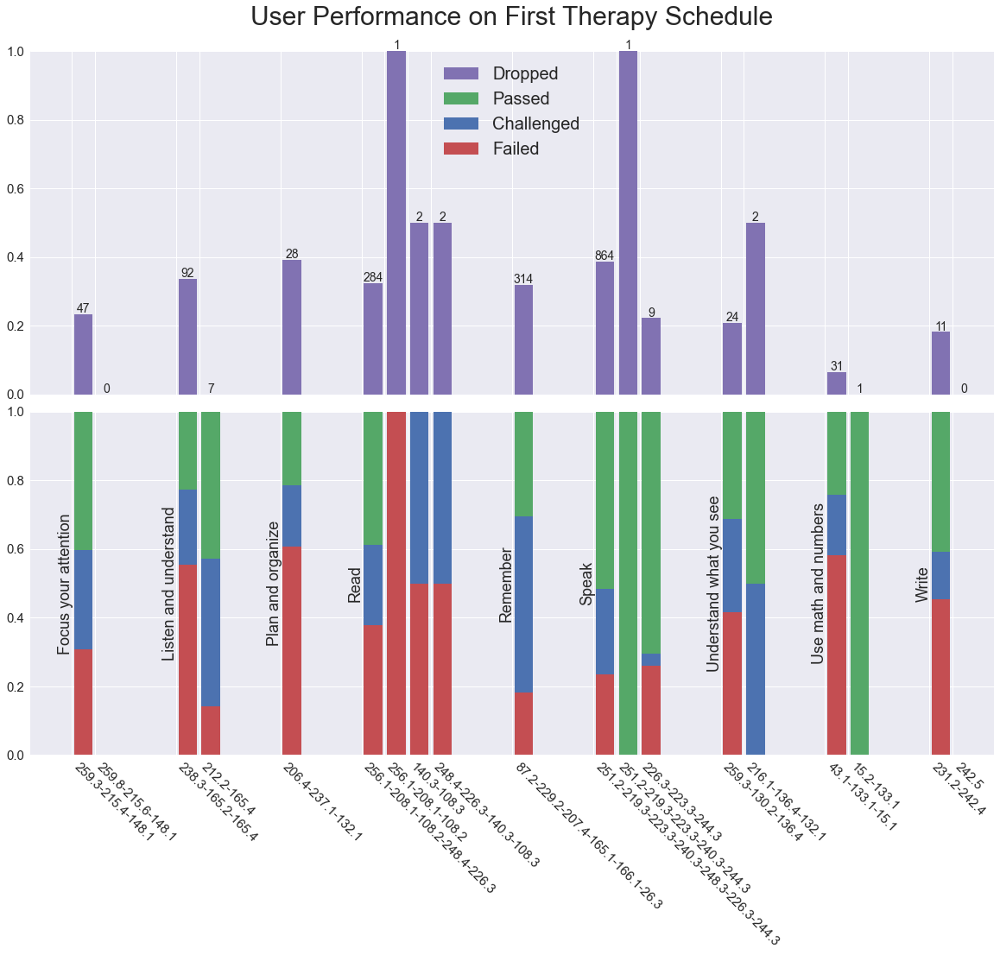

In [33]:
#Combined plot of accuracy binning and drop rate for each sequence

yf=seq_tpy_stats['failed'];
yc=seq_tpy_stats['challenged'];
yp=seq_tpy_stats['passed'];
yd=seq_tpy_stats['dropped'];

x=[];
delta=2.5;
j=-1*delta;
for skill in list_of_skills:
    j+=delta;
    for k in range(len(seq_tpy_stats.loc[skill])):
        x+=[j];
        j+=1;
        
skill_x=[len(seq_tpy_stats.loc[skill]) for skill in list_of_skills];
skill_x=[sum(skill_x[0:j]) for j in range(len(skill_x))];
        
fig, ax=plt.subplots(2,1,sharex='col',figsize=(20,15));

ax[0].bar(x,yd,color=sns.color_palette()[3],label='Dropped');
ax[0].bar(x,0*yp,color=sns.color_palette()[1],label='Passed',bottom=yf+yc);
ax[0].bar(x,0*yc,color=sns.color_palette()[0],label='Challenged',bottom=yf);
ax[0].bar(x,0*yf,color=sns.color_palette()[2],label='Failed');

for l in range(len(x)):
    ax[0].text(x[l],np.nan_to_num(yd[l])+0.005,seq_tpy_stats['tpy_count'
                            ].iloc[l].astype('int'),size=14, ha='center');

ax[0].yaxis.set_tick_params(labelsize=15);
ax[0].set_title('User Performance on First Therapy Schedule',size=30, pad=30);
ax[0].legend(fontsize=20);

ax[1].bar(x,yf,color=sns.color_palette()[2],label='Failed');
ax[1].bar(x,yc,color=sns.color_palette()[0],label='Challenged',bottom=yf);
ax[1].bar(x,yp,color=sns.color_palette()[1],label='Passed',bottom=yf+yc);
ax[1].yaxis.set_tick_params(labelsize=15);
ax[1].set_xticks(np.array(x)-.5);
ax[1].set_xticklabels(seq_tpy_stats.reset_index('sequence').sequence,
                            size=15, rotation=-45, ha='left');

for l in range(len(list_of_skills)):
    ax[1].text(x[skill_x[l]]-0.75,0.5,list_of_skills[l],size=18,
               rotation=90,ha='center',va='center');

plt.subplots_adjust(hspace=0.05)

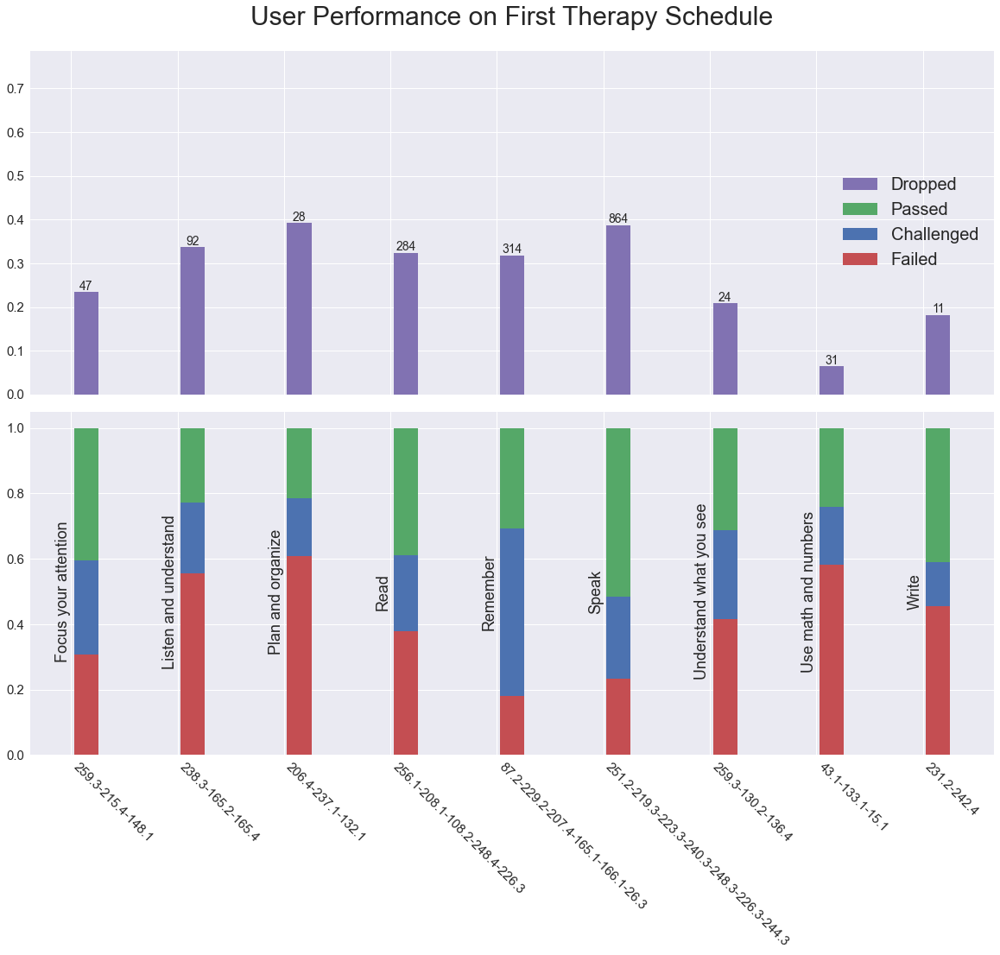

In [34]:
#Same plot as above but filtered to high occurance skills/sequences in therapy

yf=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['failed'];
yc=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['challenged'];
yp=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['passed'];
yd=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['dropped'];

x=[];
delta=2.5;
j=-1*delta;
for skill in list_of_skills:
    j+=delta;
    for k in range(len(seq_tpy_stats[seq_tpy_stats['tpy_count']>10].loc[skill])):
        x+=[j];
        j+=1;
        
skill_x=[len(seq_tpy_stats[seq_tpy_stats['tpy_count']>10].loc[skill]) 
         for skill in list_of_skills];
skill_x=[sum(skill_x[0:j]) for j in range(len(skill_x))];
        
fig, ax=plt.subplots(2,1,sharex='col',figsize=(20,15));

ax[0].bar(x,yd,color=sns.color_palette()[3],label='Dropped');
ax[0].bar(x,0*yp,color=sns.color_palette()[1],label='Passed',bottom=yf+yc);
ax[0].bar(x,0*yc,color=sns.color_palette()[0],label='Challenged',bottom=yf);
ax[0].bar(x,0*yf,color=sns.color_palette()[2],label='Failed');

for l in range(len(x)):
    ax[0].text(x[l],np.nan_to_num(yd[l])+0.005,seq_tpy_stats[seq_tpy_stats['tpy_count']>10][
        'tpy_count'].iloc[l].astype('int'),size=14, ha='center');

ax[0].yaxis.set_tick_params(labelsize=15);
ax[0].set_title('User Performance on First Therapy Schedule',size=30, pad=30);
ax[0].legend(fontsize=20);

ax[1].bar(x,yf,color=sns.color_palette()[2],label='Failed');
ax[1].bar(x,yc,color=sns.color_palette()[0],label='Challenged',bottom=yf);
ax[1].bar(x,yp,color=sns.color_palette()[1],label='Passed',bottom=yf+yc);
ax[1].yaxis.set_tick_params(labelsize=15);
ax[1].set_xticks(np.array(x)-.5);
ax[1].set_xticklabels(seq_tpy_stats[seq_tpy_stats['tpy_count']>10].reset_index(
    'sequence').sequence,size=15, rotation=-45, ha='left');

for l in range(len(list_of_skills)):
    ax[1].text(x[skill_x[l]]-0.75,0.5,list_of_skills[l],size=18,
               rotation=90,ha='center',va='center');

plt.subplots_adjust(hspace=0.05)

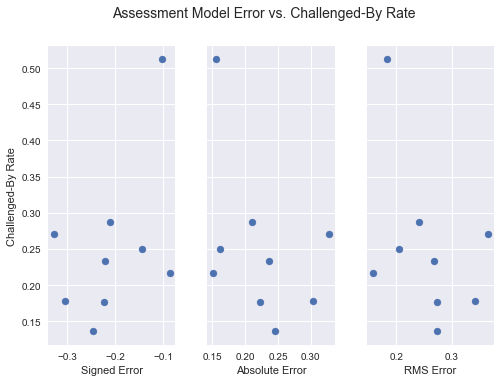

In [35]:
#Model Error vs Challenged-By PLot

x0=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['sign_error'];
x1=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['abs_error'];
x2=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['rms_error'];
y=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['challenged'];

fig, ax=plt.subplots(1,3,sharey='row');
fig.suptitle("Assessment Model Error vs. Challenged-By Rate", fontsize=14)

ax[0].scatter(x0,y);
ax[1].scatter(x1,y);
ax[2].scatter(x2,y);

ax[0].set_ylabel('Challenged-By Rate');
ax[0].set_xlabel('Signed Error');
ax[1].set_xlabel('Absolute Error');
ax[2].set_xlabel('RMS Error');

plt.subplots_adjust(wspace=0.25)

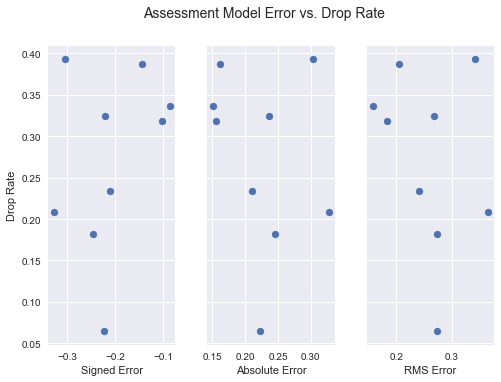

In [36]:
#Model Error vs Drop-Rate PLot

x0=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['sign_error'];
x1=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['abs_error'];
x2=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['rms_error'];
y=seq_tpy_stats[seq_tpy_stats['tpy_count']>10]['dropped'];

fig, ax=plt.subplots(1,3,sharey='row');
fig.suptitle("Assessment Model Error vs. Drop Rate", fontsize=14)

ax[0].scatter(x0,y);
ax[1].scatter(x1,y);
ax[2].scatter(x2,y);

ax[0].set_ylabel('Drop Rate');
ax[0].set_xlabel('Signed Error');
ax[1].set_xlabel('Absolute Error');
ax[2].set_xlabel('RMS Error');

plt.subplots_adjust(wspace=0.25)

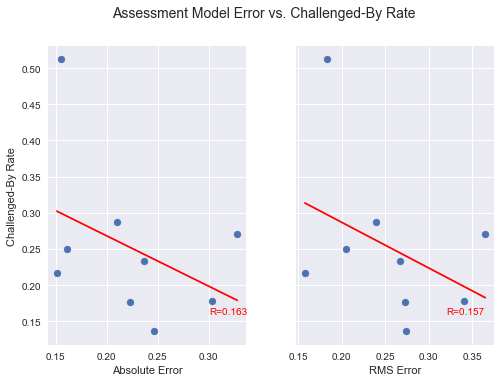

In [37]:
#Model Error vs Challenged-By PLot with Fit

from sklearn.linear_model import LinearRegression
model_1=LinearRegression(fit_intercept=True);
model_2=LinearRegression(fit_intercept=True);

x1=seq_tpy_stats[seq_tpy_stats['tpy_count']>10].dropna()['abs_error'];
x2=seq_tpy_stats[seq_tpy_stats['tpy_count']>10].dropna()['rms_error'];
y=seq_tpy_stats[seq_tpy_stats['tpy_count']>10].dropna()['challenged'];

model_1.fit(x1.values[:,np.newaxis],y);
model_2.fit(x2.values[:,np.newaxis],y);

xfit_1=np.linspace(x1.min(),x1.max(),1000);
xfit_2=np.linspace(x2.min(),x2.max(),1000);

yfit_1=model_1.predict(xfit_1[:,np.newaxis]);
yfit_2=model_2.predict(xfit_2[:,np.newaxis]);

fig, ax=plt.subplots(1,2,sharey='row');
fig.suptitle("Assessment Model Error vs. Challenged-By Rate", fontsize=14)

ax[0].scatter(x1,y);
ax[1].scatter(x2,y);

ax[0].plot(xfit_1,yfit_1,c='r');
ax[1].plot(xfit_2,yfit_2,c='r');

ax[0].text(0.3,0.16,'R='+str(model_1.score(x1.values[:,np.newaxis],y).round(3)),c='r');
ax[1].text(0.32,0.16,'R='+str(model_2.score(x2.values[:,np.newaxis],y).round(3)),c='r');

ax[0].set_ylabel('Challenged-By Rate');
ax[0].set_xlabel('Absolute Error');
ax[1].set_xlabel('RMS Error');

plt.subplots_adjust(wspace=0.25)

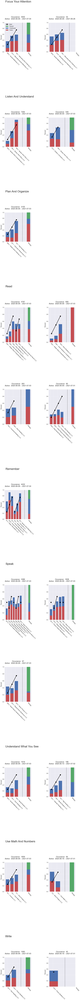

In [38]:
#Assessment to First Therapy Perform Comparisson

#List of skills in order
list_of_skills=lid_stats.reset_index()['skill'].unique();

#Finding number of rows for each skill (2 sequences per row)
heights=[np.ceil(len(lid_stats.loc[skill].reset_index()['sequence'].unique())/2)
             for skill in list_of_skills];

#Plot initialization
w=0.75
fail_fig = plt.figure(figsize=(18,250));
gs0=gridspec.GridSpec(len(list_of_skills),1,figure=fail_fig, 
                      height_ratios=np.array(heights)**2);

#Looping over each skill
for j in range(len(list_of_skills)):
    #Subgrid for skill
    gs=gridspec.GridSpecFromSubplotSpec(int(heights[j]), 2, subplot_spec=gs0[j]);
    #Subdataset for skill
    skill_to_plot=lid_stats.loc[list_of_skills[j]].reset_index().set_index(['sequence','lid']);
    list_of_sequences=skill_to_plot.reset_index()['sequence'].unique();
    
    #Looping over each sequence
    for k in range(len(list_of_sequences)):
        #Creating plot in slot
        ax=fail_fig.add_subplot(gs[int(np.floor(k/2)),k%2]);
        #Subdataset for sequence
        seq_to_plot=skill_to_plot.loc[list_of_sequences[k]];
        
        #Assessment Failures and challenged by as bar heights
        y_a_f=seq_to_plot['fail'];
        y_a_m=seq_to_plot['middle']
        x_a=np.arange(len(y_a_f));
        
        #Therapy Info
        y_t_f=seq_tpy_stats.loc[list_of_skills[j]].loc[list_of_sequences[k]]['failed'];
        y_t_c=seq_tpy_stats.loc[list_of_skills[j]].loc[list_of_sequences[k]]['challenged'];
        y_t_p=seq_tpy_stats.loc[list_of_skills[j]].loc[list_of_sequences[k]]['passed'];
        x_t=len(x_a)+np.sqrt(len(x_a));
        
        #Therapy accuracy bins plot
        ax.bar(x_t,y_t_f,w,color=sns.color_palette()[2]);
        ax.bar(x_t,y_t_c,w,color=sns.color_palette()[0],bottom=y_t_f);
        ax.bar(x_t,y_t_p,w,color=sns.color_palette()[1],bottom=y_t_f+y_t_c,label='Passed');
        
        #Assessment plot
        pm=ax.bar(x_a,y_a_m,w,color=sns.color_palette()[0],label='Challenged',bottom=y_a_f);
        pf=ax.bar(x_a,y_a_f,w,color=sns.color_palette()[2],label='Failed');
        
        #Ideal Fail Progression Overlay
        y_ideal=(x_a+1)/(len(x_a)+1);
        #Special cases with domain changes
        if (j==3) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x_a[-2:],y_ideal2,'-ok',linewidth=4,markersize=15);
        if (j==4) & (k==0):
            y_ideal=np.array([1/4,2/4,3/4]);
            y_ideal2=np.array([1/4,2/4,3/4]);
            ax.plot(x_a[-3:],y_ideal2,'-ok',linewidth=4,markersize=15);
        if (j==5) & (k==0):
            y_ideal=np.array([1/2]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x_a[1:3],y_ideal2,'-ok',linewidth=4,markersize=15);
            y_ideal3=np.array([1/2]);
            ax.plot(x_a[3],y_ideal3,'-ok',linewidth=4,markersize=15);
            y_ideal4=np.array([1/3,2/3]);
            ax.plot(x_a[4:6],y_ideal4,'-ok',linewidth=4,markersize=15);
            y_ideal5=np.array([1/2]);
            ax.plot(x_a[-1],y_ideal5,'-ok',linewidth=4,markersize=15)
        if (j==5) & (k==1):
            y_ideal=np.array([1/2]);
            y_ideal2=np.array([1/3,2/3]);
            ax.plot(x_a[1:3],y_ideal2,'-ok',linewidth=4,markersize=15);
            y_ideal3=np.array([1/2]);
            ax.plot(x_a[3],y_ideal3,'-ok',linewidth=4,markersize=15);
            y_ideal4=np.array([1/2]);
            ax.plot(x_a[4],y_ideal4,'-ok',linewidth=4,markersize=15);
        
        pi=ax.plot(x_a[0:len(y_ideal)],y_ideal,'-ok',linewidth=4,markersize=15,label='Ideal');
        
        #Dividing Line
        x_l=(x_t+x_a[-1])/2;
        ax.plot([x_l,x_l],[0,1],'--k');
        
        #Putting legend on only the first plot
        if (j==0) & (k==0):
            ax.legend(fontsize=18);
        
        #Create big skill header on first plot within skill
        if k==0:
            ax.text(-.5,1.8-heights[j]/9,list_of_skills[j].title(),size=40, ha='left');
            
        #Each plot title is sequence occurance and active date range
        ax.set_title(
            'Occurance:  '+
            str(seq_to_plot['seq_occurance'].iloc[0])
            +'\nActive:  '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'first_active'])[0:10]
            +' -- '+
            str(sequence_data.loc[list_of_skills[j]].loc[list_of_sequences[k]][
                'last_active'])[0:10]
                     , size=25, pad=45);
        
        #Axis and tick labels
        ax.set_ylabel('Percent', size=20, labelpad=8);
        ax.set_ylim(0,1);
        ax.set_yticks(np.linspace(0,1,6).round(1));
        ax.set_yticklabels(np.linspace(0,1,6).round(1), size=18);
        ax.set_xticks(np.concatenate([x_a,[x_t]])-w/10*len(x_a));
        ax.set_xticklabels(pd.concat([seq_to_plot.reset_index()['lid'].astype('string')+' - '
                           +seq_to_plot.reset_index()['lid_name'],pd.Series('Therapy')]),
                            size=18, rotation=-45, ha='left');
            
plt.subplots_adjust(wspace=0.65, hspace=1.35)

In [39]:
#Gathering stats on each therapy task

#Adding lid labels and assessment sequences to main therapy table
tpy_sched_data['lid']=tpy_sched_data['root_id']+tpy_sched_data['task_level']/10;

#Baseline accuracy and occurance stats for each task
tpy_lid_stats=tpy_sched_data.groupby(
    ['skill','sequence','lid'])[['failed','challenged','passed','sess_id']].aggregate(
    {'failed':'mean','challenged':'mean','passed':'mean','sess_id':'count'}).rename(
    columns={'sess_id':'occurance'});

tpy_lid_stats.sort_values(['skill','sequence','occurance'],
                          ascending=[True,True,False],inplace=True);

tpy_lid_stats

failed  challenged    passed  \
skill                sequence          lid                                    
Focus your attention 259.3-215.4-148.1 46.2  0.333333    0.333333  0.333333   
                                       96.2  0.222222    0.111111  0.666667   
                                       27.9  0.625000    0.250000  0.125000   
                                       28.0  0.500000    0.250000  0.250000   
                                       27.1  0.000000    0.428571  0.571429   
...                                               ...         ...       ...   
Write                231.2-242.4       8.4   0.250000    0.000000  0.750000   
                                       29.5  0.250000    0.000000  0.750000   
                                       6.3   0.500000    0.500000  0.000000   
                                       7.3   0.500000    0.500000  0.000000   
                                       6.4   1.000000    0.000000  0.000000   

                                             occurance  
skill                sequence          lid              
Focus your attention 259.3-215.4-148.1 46.2          9  
                                       96.2          9  
                                       27.9          8  
                                       28.0          8  
                                       27.1          7  
...                                                ...  
Write                231.2-242.4       8.4           4  
                                       29.5          4  
                                       6.3           2  
                                       7.3           2  
                                       6.4           1  

[178 rows x 4 columns]

In [44]:
tpy_lid_stats.loc['Listen and understand']

failed  challenged    passed  occurance
sequence          lid                                             
212.2-165.4       44.3   0.000000    0.500000  0.500000          4
                  42.3   0.000000    0.000000  1.000000          2
                  165.1  0.500000    0.500000  0.000000          2
                  33.1   1.000000    0.000000  0.000000          1
                  44.2   0.000000    1.000000  0.000000          1
238.3-165.2-165.4 165.1  0.809524    0.095238  0.095238         21
                  165.3  0.588235    0.235294  0.176471         17
                  165.5  0.357143    0.285714  0.357143         14
                  165.2  0.538462    0.230769  0.230769         13
                  165.4  0.444444    0.333333  0.222222          9
                  44.3   0.750000    0.125000  0.125000          8
                  33.1   0.833333    0.166667  0.000000          6
                  42.3   0.666667    0.000000  0.333333          6
                  42.2   0.400000    0.000000  0.600000          5
                  44.2   0.400000    0.600000  0.000000          5
                  16.1   0.500000    0.000000  0.500000          2

In [40]:
#Looking specifically at the most common track, whose performance stats aren't great.

speak_lid_stats=tpy_lid_stats.loc['Speak'].loc['251.2-219.3-223.3-240.3-248.3-226.3-244.3'];

speak_lid_stats

,failed,challenged,passed,occurance
lid,,,,
4.2,0.468553,0.061321,0.470126,636
193.1,0.258850,0.110619,0.630531,452
1.4,0.401554,0.313472,0.284974,386
81.1,0.410326,0.089674,0.500000,368
97.2,0.073248,0.264331,0.662420,314
19.2,0.568690,0.249201,0.182109,313
2.3,0.402174,0.307971,0.289855,276
19.3,0.193798,0.465116,0.341085,258
2.2,0.515695,0.295964,0.188341,223


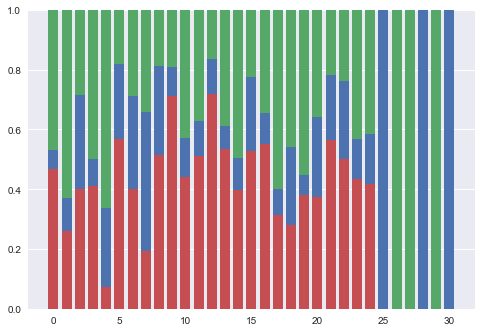

In [41]:
yf=speak_lid_stats['failed'];
yc=speak_lid_stats['challenged'];
yp=speak_lid_stats['passed'];
x=np.arange(len(yf));

plt.bar(x,yp,w,color=sns.color_palette()[1],label='Passed',bottom=yf+yc);
plt.bar(x,yc,w,color=sns.color_palette()[0],label='Challenged',bottom=yf);
plt.bar(x,yf,w,color=sns.color_palette()[2],label='Failed');

In [42]:
seq_acc_data['start_date'].min()

Timestamp('2020-06-12 15:05:10')

In [43]:
pd.DataFrame(sequence_data['occurance'])

occurance
skill                   sequence                                            
Focus your attention    259.3-215.4-148.1                               3930
                        259.8-215.6-148.1                                 54
Listen and understand   238.3-165.2-165.4                               7264
                        212.2-165.4                                      549
Plan and organize       206.4-237.1-132.1                               2105
Read                    256.1-208.1-108.2-248.4-226.3                   4787
                        256.1-208.1-108.2                                806
                        140.3-108.3                                      283
                        248.4-226.3-140.3-108.3                           60
Remember                87.2-229.2-207.4-165.1-166.1-26.3               4432
Speak                   251.2-219.3-223.3-240.3-248.3-226.3-244.3       3366
                        251.2-219.3-223.3-240.3-244.3                   1838
                        226.3-223.3-244.3                                 97
Understand what you see 259.3-130.2-136.4                               1919
                        216.1-136.4-132.1                                196
Use math and numbers    43.1-133.1-15.1                                 1859
                        15.2-133.1                                        84
Write                   231.2-242.4                                     1065
                        242.5                                             45